### Constraint-based Chain-of-States methods for Baker sets

**Authors: Zilin Song**

#### a. Imports

In [4]:
# Generic Python.
import sys
sys.dont_write_bytecode = True
from typing import Type, List

# Misc.
import numpy
import matplotlib.pyplot as plt
import matplotlib.ticker as plt_ticker
from matplotlib.axes import Axes
import seaborn as sns

#### b. Calculations

calculations are at ./ms0_car/fig_pyscf/car_paths/rxn*

In [5]:
def load_ener(rxn_id: int, which_path: str):
    """Load the energy vector, which_path = 'cimg' or 'mini'. """
    if not which_path in ['cimg', 'mini']:
        raise ValueError('wrong which_path spec. ')
    

    if rxn_id in [11, 17, 21] and which_path == 'mini':
        lines = open(f'./ms0_car/fig_pyscf/car_paths/rxn{rxn_id}/{which_path}_ener_fine.log', 'r').readlines()
    else:
        lines = open(f'./ms0_car/fig_pyscf/car_paths/rxn{rxn_id}/{which_path}_ener.log'     , 'r').readlines()
    
    ener = []
    l = lines[-1].strip().split(':')[-1]
    for _ in range(7):
        ener.append(float(l.split()[_]))

    ener  = numpy.asarray(ener)
    ener -= numpy.min(ener)

    return ener

def load_traj(rxn_id: int):
    """Load the constraint convergence log. """
    lines = open(f'./ms0_car/fig_pyscf/car_paths/rxn{rxn_id}/mini_cons.log', 'r').readlines()
    
    itr = []
    rms = []
    for l in lines:
        words = l.split()
        itr.append(int(words[1]))
        rms.append(float(words[2]))
    
    return itr, rms

def plot_figs(rxn_id: int, axes: Axes):
    """Plot the complete figure."""
    ax = axes[0]

    ener0 = load_ener(rxn_id, 'mini')
    fwb_ener0 = numpy.max(ener0) - ener0[0]
    bwb_ener0 = numpy.max(ener0) - ener0[-1]
    ax.plot(numpy.arange(7)+1, ener0, lw=1.5, color="#9A1663", zorder=5, marker='.', markersize=7, label='CAR-PT (fine)' if rxn_id in [11, 17, 21] else 'CAR-PT')
    ax.text(0.05, 1.05, r"$\Delta E_{forward}$ = "+f"{fwb_ener0:.4f}"+"\n"+r"$\Delta E_{reverse}$ = "+f"{bwb_ener0:.4f}", c="#9A1663", ha='left', va='bottom', transform=ax.transAxes, fontsize=8)

    if not rxn_id in [10, 19, 25]: # No CI.
        ener1 = load_ener(rxn_id, 'cimg')
        fwb_ener1 = numpy.max(ener1) - ener1[0]
        bwb_ener1 = numpy.max(ener1) - ener1[-1]
        ax.plot(numpy.arange(7)+1, ener1, lw=1.5, color="#FF97C1", zorder=5, marker='.', markersize=7, label='CI-CAR-PT')
        ax.text(0.95, 1.05, r"$\Delta E_{forward}$ = "+f"{fwb_ener1:.4f}"+"\n"+r"$\Delta E_{reverse}$ = "+f"{bwb_ener1:.4f}", c="#FF97C1", ha='right', va='bottom', transform=ax.transAxes, fontsize=8)

    ax.set_xlabel(r"# Replica")
    ax.set_ylabel(r"Energy ($kcal\ mol^{-1}$)")
    ax.tick_params(direction='in', width=1.5, length=4, labelsize=12)
    ax.spines['left'].set_linewidth(1.5)
    ax.spines['bottom'].set_linewidth(1.5)
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)

    ax.legend(frameon=False)

    ax = axes[1]

    itr, rms = load_traj(rxn_id=rxn_id)
    ax.tick_params(direction='in', width=1.5, length=4, labelsize=12)
    ax.spines['left'].set_linewidth(1.5)
    ax.spines['bottom'].set_linewidth(1.5)
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)
    ax.set(ylim=(-1, 11), yticks=[0, 5, 10])
    ax.plot(numpy.arange(len(itr))+1, itr, color="#219EBC", label='CAR', marker='.', markersize=5, lw=1.5)
    ax.set_ylabel('# Update Steps') 
    ax.set_xlabel('# Descent Steps') 

    ax = axes[2]
    ax.tick_params(direction='in', width=1.5, length=4, labelsize=12)
    ax.tick_params(axis='y')
    ax.spines['left'].set_linewidth(1.5)
    ax.spines['bottom'].set_linewidth(1.5)
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)
    ax.set(ylim=(1e-18, 100.), yscale='log', yticks=[1e-16, 1e-8, 1.], )
    ax.plot(numpy.arange(len(itr))+1, rms, color="#90C9E7", label='CAR', marker='.', markersize=5, lw=1.5)
    ax.set_ylabel(r'$\mathrm{\Delta RMS}_{MAX}}$ ($\AA$)') 
    ax.set_xlabel('# Descent Steps') 

    return axes

#### c. mk plots.

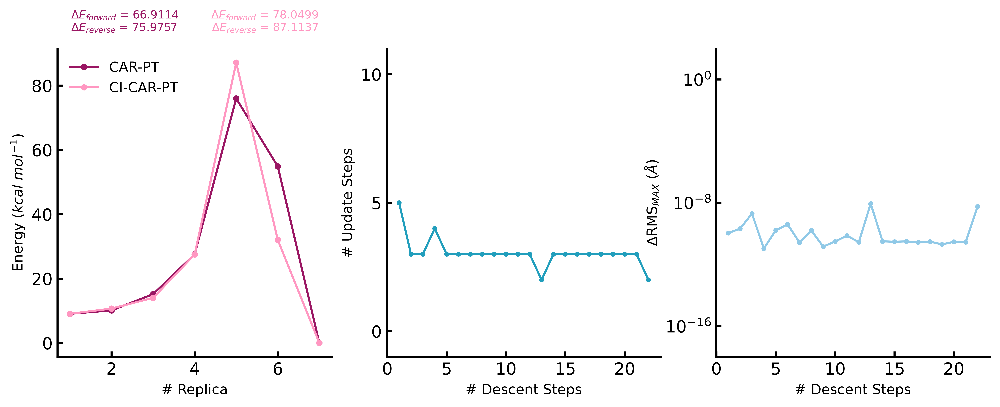

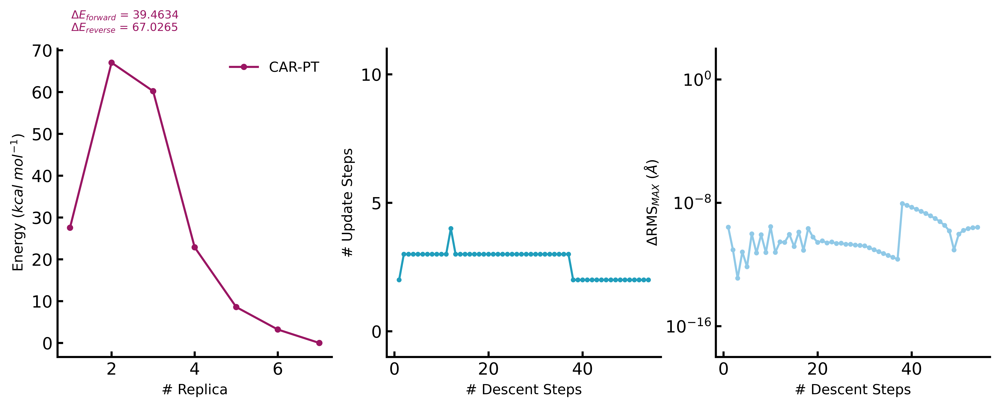

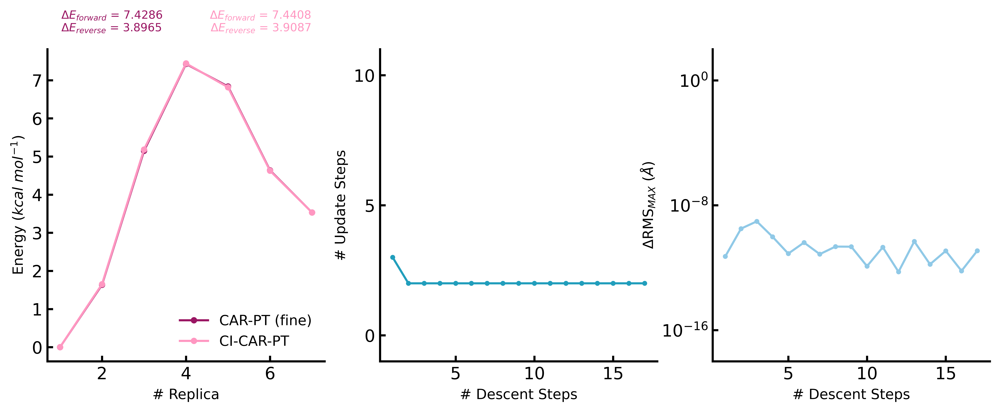

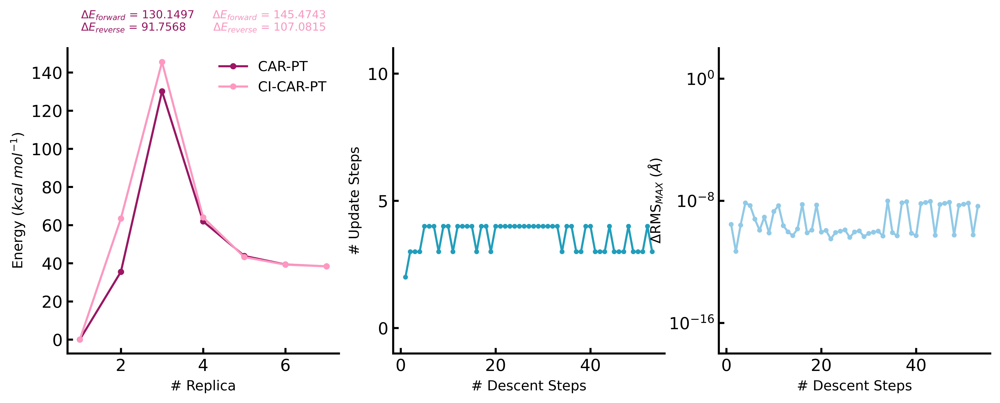

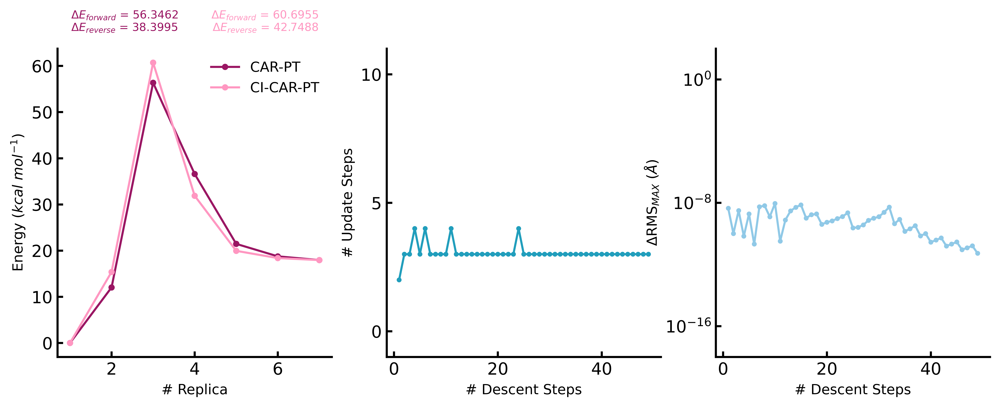

...

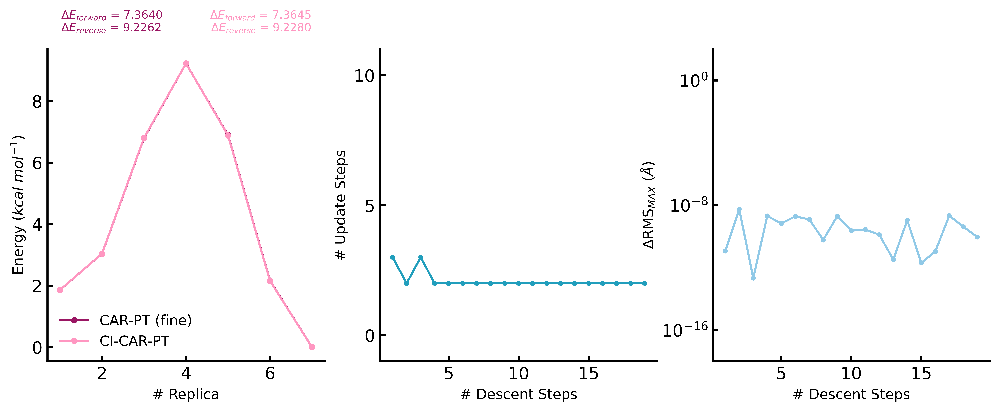

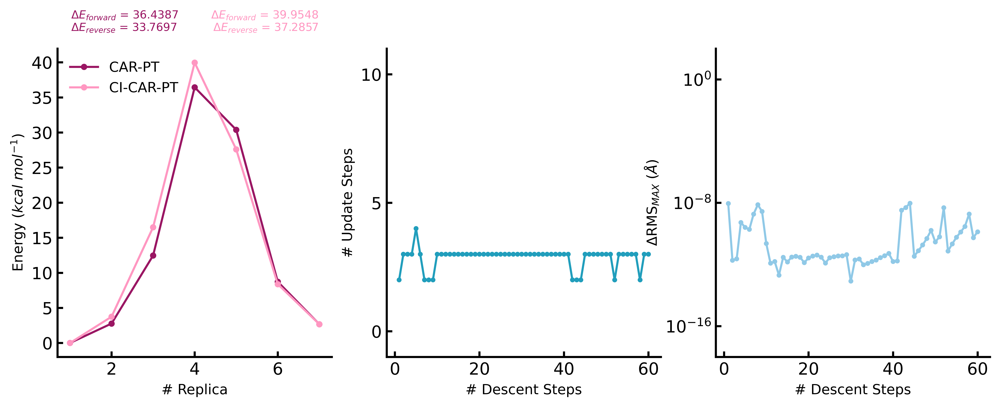

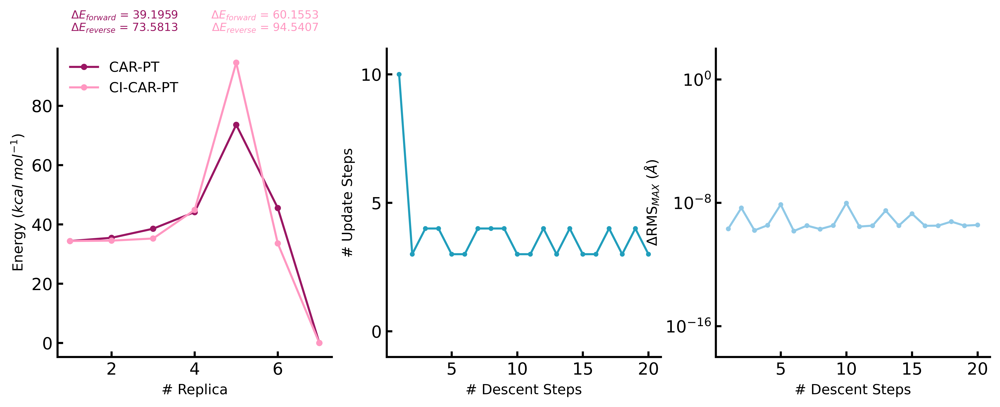

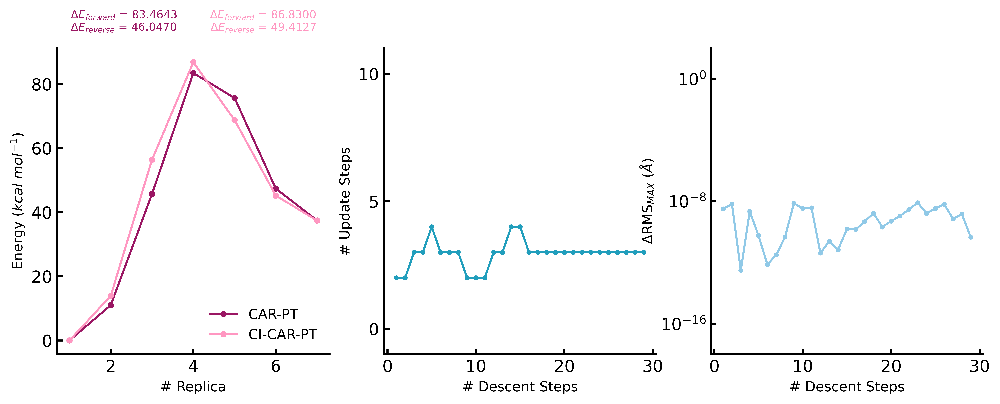

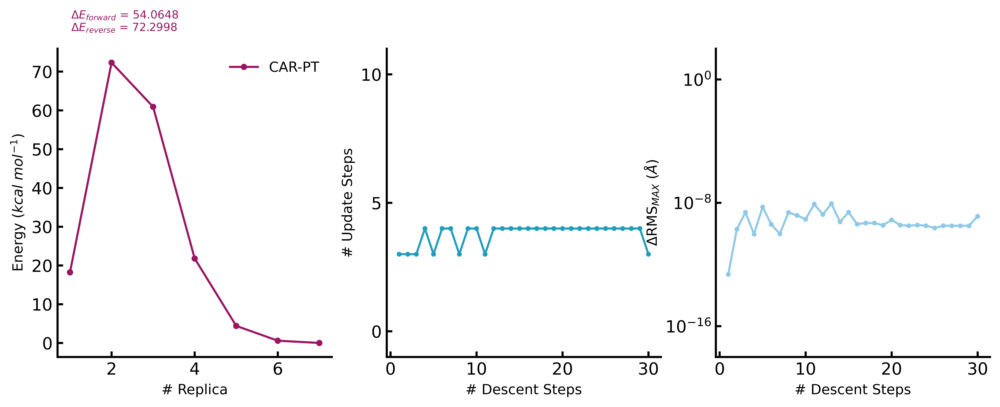

In [6]:

for rxn_id in [3,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25]:
    fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(12,4), dpi=900)
    # plt.subplots_adjust(left=1./12., right=10/12., top=3.4/4., bottom=1./4.)

    plot_figs(rxn_id, axes)

    plt.savefig(f'./ms0_car/fig_pyscf/si_figs/rxn{rxn_id}.jpeg')